In [15]:
import silence_tensorflow.auto
from ensmallen_graph.datasets.linqs import CiteSeer, PubMedDiabetes, Cora
from ensmallen_graph.datasets.yue import MashupPPI, ClinTermCOOC, node2vecPPI, CTDDDA, NDFRTDDA
from embiggen.utils import compute_node_embedding, get_available_node_embedding_methods
from embiggen import GraphVisualization
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, accuracy_score
from sanitize_ml_labels import sanitize_ml_labels

In [13]:
import pandas as pd

def load_multi_labels(path: str) -> pd.DataFrame:
    data = pd.read_csv(
        path,
        header=None
    )[0].str.strip().str.split(" ", expand=True).set_index(0).fillna(-1).astype(int)

    unique_values = [
        val
        for val in np.unique(data.values.flatten())
        if val >= 0
    ]

    return pd.DataFrame({
        node_id: {
            node_type: node_type in row.values
            for node_type in unique_values
        }
        for node_id, row in data.iterrows()
    }).T.astype(int)


def load_mashup_multi_labels() -> pd.DataFrame:
    return load_multi_labels("graphs/yue/MashupPPI/yue/Mashup_PPI_labels.txt")


def load_node2vec_multi_labels() -> pd.DataFrame:
    return load_multi_labels("graphs/yue/node2vecPPI/yue/node2vec_PPI_labels.txt")


def load_clinterm_multi_labels() -> pd.DataFrame:
    multi_label = load_multi_labels("graphs/yue/ClinTermCOOC/yue/Clin_Term_COOC_labels.txt")
    labels_names = pd.read_csv("graphs/yue/ClinTermCOOC/yue/label_list.txt", sep="\t")
    multi_label.columns = labels_names.label_name.values
    return multi_label

In [4]:
from typing import Dict
from sanitize_ml_labels import sanitize_ml_labels
from matplotlib.colors import ListedColormap


def plot_multi_labels_nodes(
    self,
    node_labels: pd.DataFrame,
    max_graphs_per_row: int = 4,
    square_size: int = 4,
    scatter_kwargs: Dict = None,
    other_label: str = "Other",
    verbose: bool = True
):
    
    if scatter_kwargs is None:
        scatter_kwargs = GraphVisualization.DEFAULT_SCATTER_KWARGS
    
    columns_number = min(node_labels.shape[1], max_graphs_per_row)
    rows_number = int(np.ceil(node_labels.shape[1] / max_graphs_per_row))
    fig, axes = plt.subplots(
        ncols=columns_number,
        nrows=rows_number,
        figsize=(
            square_size*columns_number,
            square_size*rows_number,
        ),
        dpi=100
    )
    
    node_embeddding, node_labels_remapping = self._shuffle(
        self._node_embedding.loc[node_labels.index],
        np.arange(node_labels.shape[0])
    )
    
    node_labels = node_labels.iloc[node_labels_remapping]
    
    for column, axis in tqdm(
            zip(
            node_labels.columns,
            axes.flatten()
        ),
        total=node_labels.shape[1],
        desc="Plotting node types",
        disable=not verbose,
        leave=False
    ):
        scatter = axis.scatter(
            *node_embeddding.T.values,
            c=node_labels[column],
            cmap=ListedColormap(["tab:orange", "tab:blue"]),
            **scatter_kwargs,
        )
        
        self._set_legend(
            axis,
            [other_label, sanitize_ml_labels(column)],
            scatter.legend_elements()[0]
        )
        self._clear_axes(
            fig, axis,
            "Nodes label {} - {}".format(column, self._graph.get_name())
        )
    for axis in axes.flatten():
        axis.set_axis_off()
    
    return fig, axes

Graphs:   0%|          | 0/7 [00:00<?, ?it/s]

The undirected graph CiteSeer has 3327 nodes with 7 different node types:  the 5 most common are DB (nodes number 701), IR (nodes number 668), Agents (nodes number 596), ML (nodes number 590) and HCI (nodes number 508), of which 48 are singletons (all have self-loops), and 4676 unweighted edges with a single edge type: Paper2Paper, of which 124 are self-loops. The graph is quite sparse as it has a density of 0.00083 and has 438 connected components, where the component with most nodes has 2120 nodes and the component with the least nodes has a single node. The graph median node degree is 2, the mean node degree is 2.77, and the node degree mode is 1. The top 5 most central nodes are brin98anatomy (degree 99), rao95bdi (degree 51), chakrabarti98automatic (degree 35), bharat98improved (degree 34) and lawrence98searching (degree 30). The hash of the graph is c6eb5278169d75d9 .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

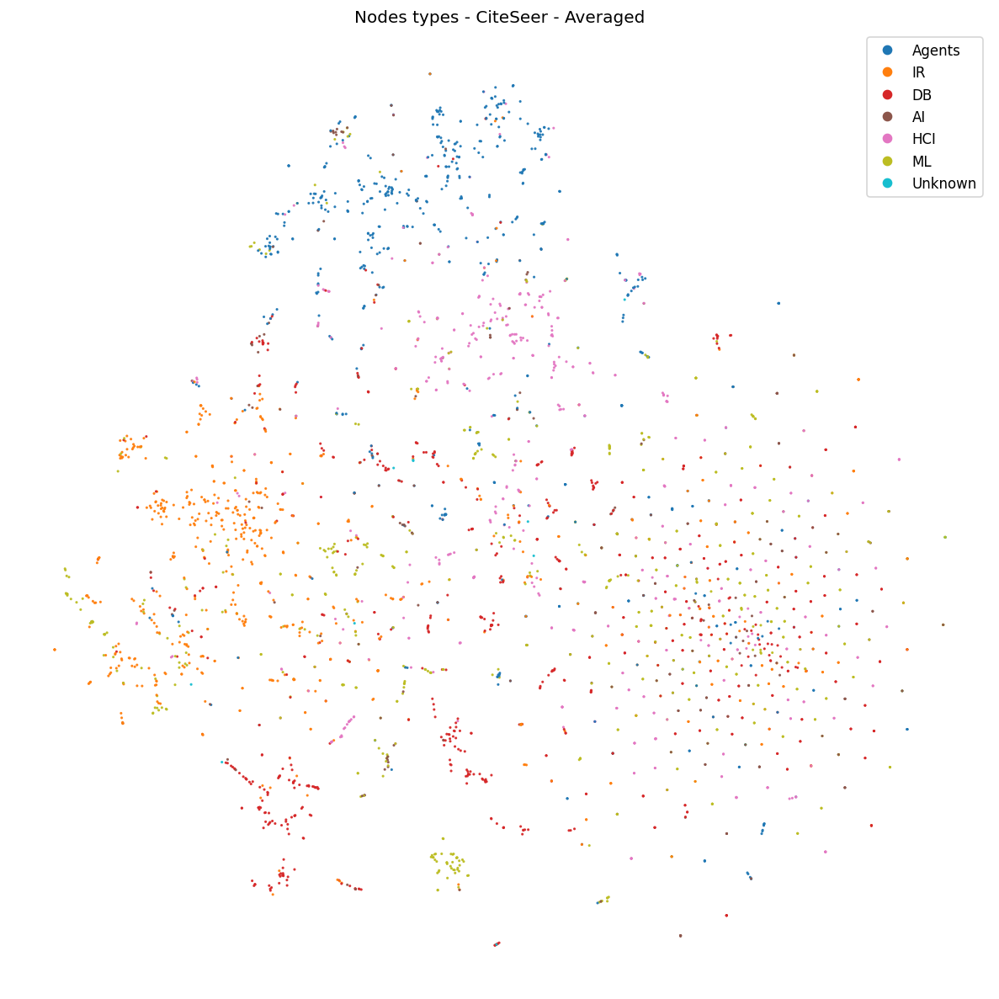

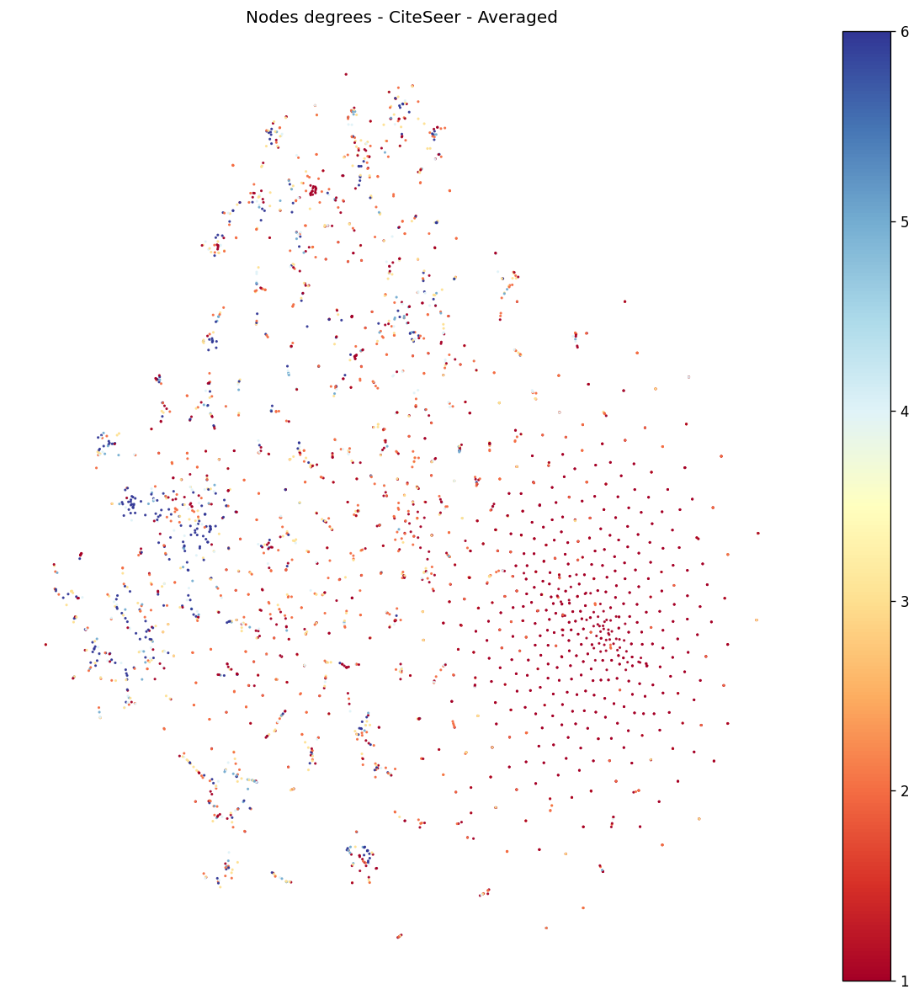

The undirected graph PubMedDiabetes has 19717 nodes with 3 different node types: Diabetes Mellitus Type 1 (nodes number 7875), Diabetes Mellitus Type 2 (nodes number 7739) and Diabetes Mellitus, Experimental (nodes number 4103) and 44327 weighted edges with a single edge type: Paper2Paper, of which 3 are self-loops. The graph is quite sparse as it has a density of 0.00023 and is connected, as it has a single component. The graph median node degree is 2, the mean node degree is 4.50, and the node degree mode is 1. The top 5 most central nodes are 9742976 (degree 171), 8366922 (degree 154), 11832527 (degree 131), 19479186 (degree 130) and 18776148 (degree 125). The hash of the graph is 2882337654d4caf1 .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

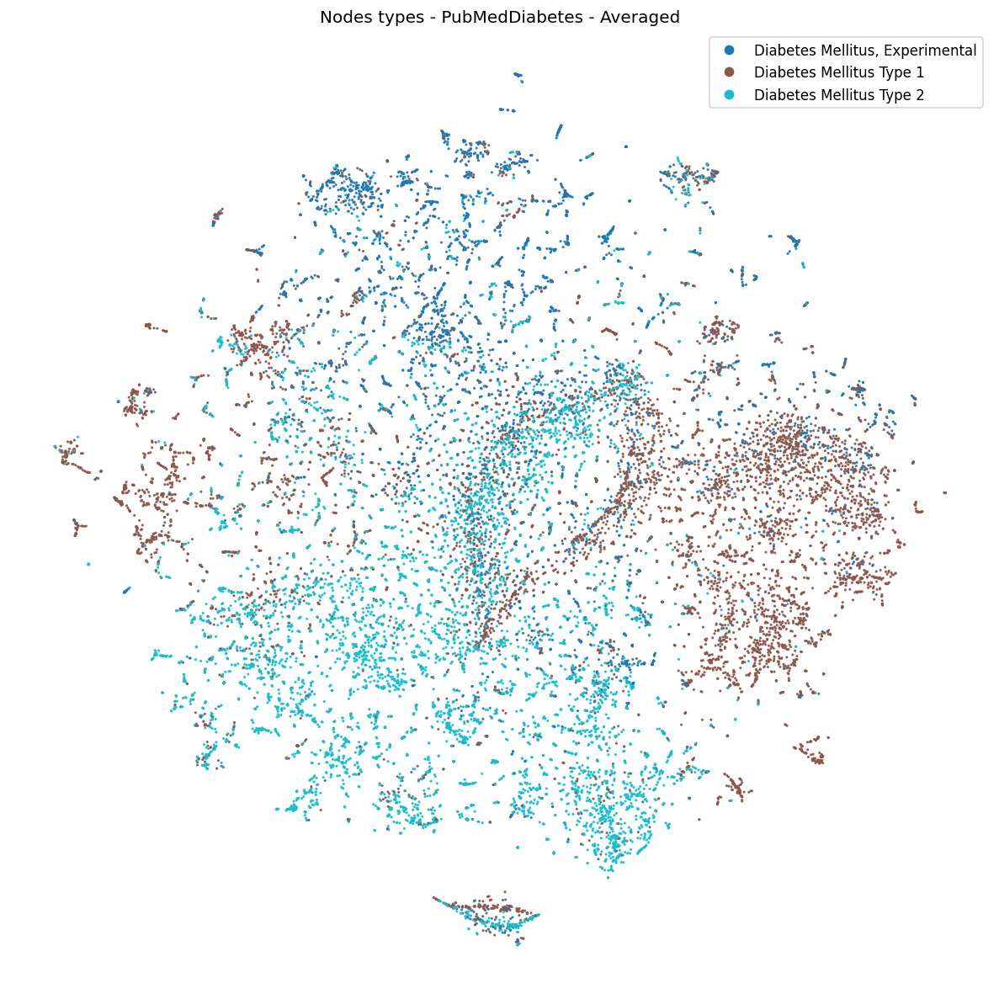

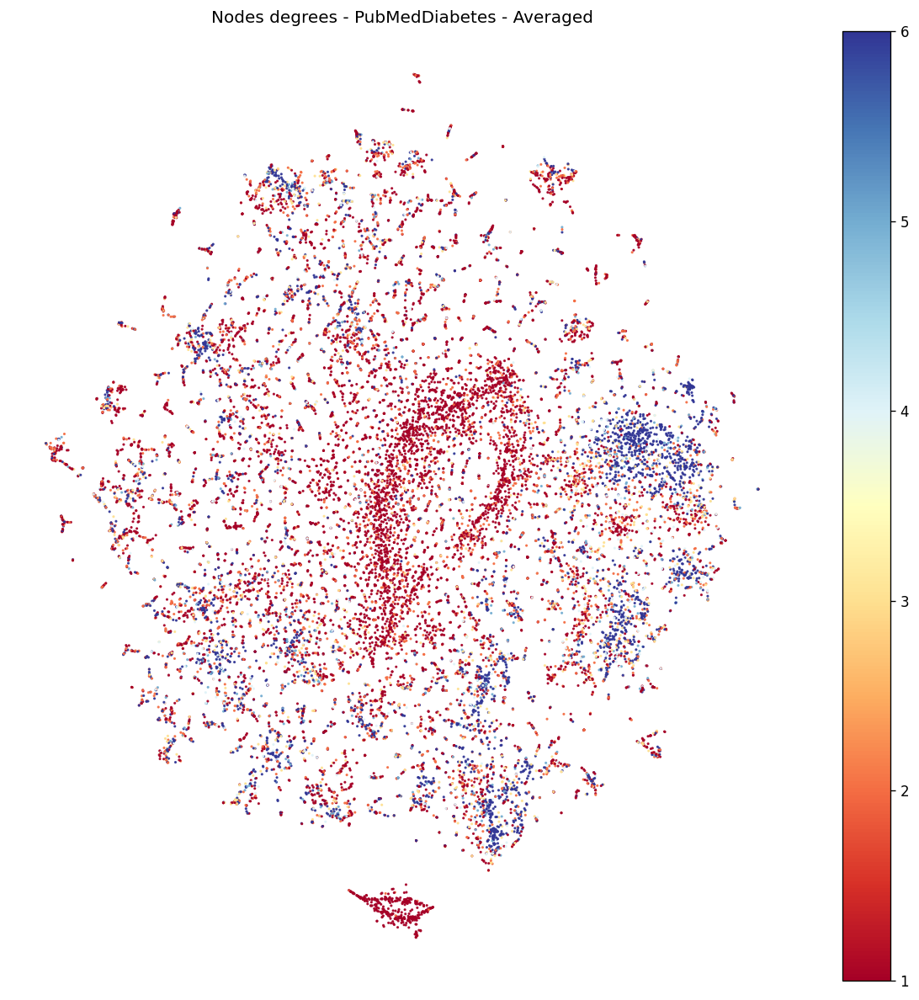

The undirected graph Cora has 2708 nodes with 7 different node types:  the 5 most common are Neural_Networks (nodes number 818), Probabilistic_Methods (nodes number 426), Genetic_Algorithms (nodes number 418), Theory (nodes number 351) and Case_Based (nodes number 298) and 5278 unweighted edges with a single edge type: Paper2Paper, of which none are self-loops. The graph is sparse as it has a density of 0.00144 and has 78 connected components, where the component with most nodes has 2485 nodes and the component with the least nodes has 2 nodes. The graph median node degree is 3, the mean node degree is 3.90, and the node degree mode is 2. The top 5 most central nodes are 35 (degree 168), 6213 (degree 78), 1365 (degree 74), 3229 (degree 65) and 910 (degree 44). The hash of the graph is a330cf2cdce2409d .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

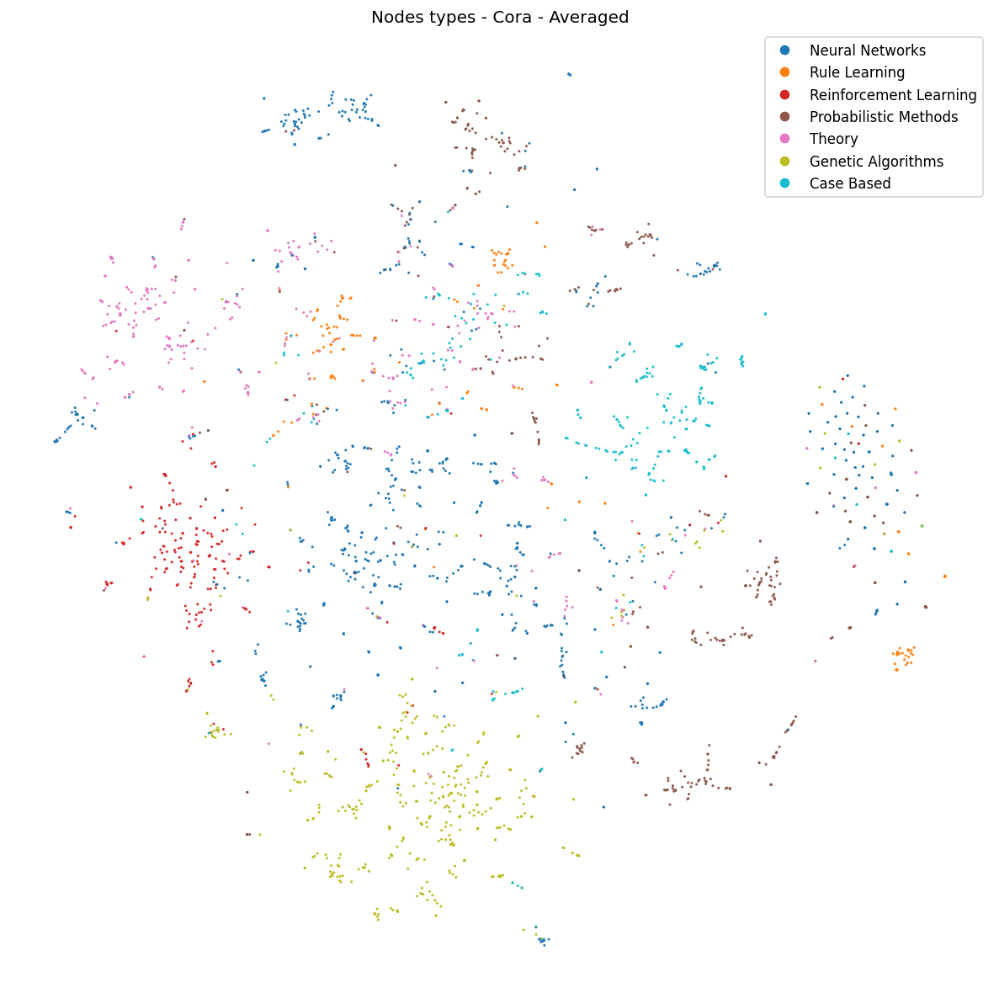

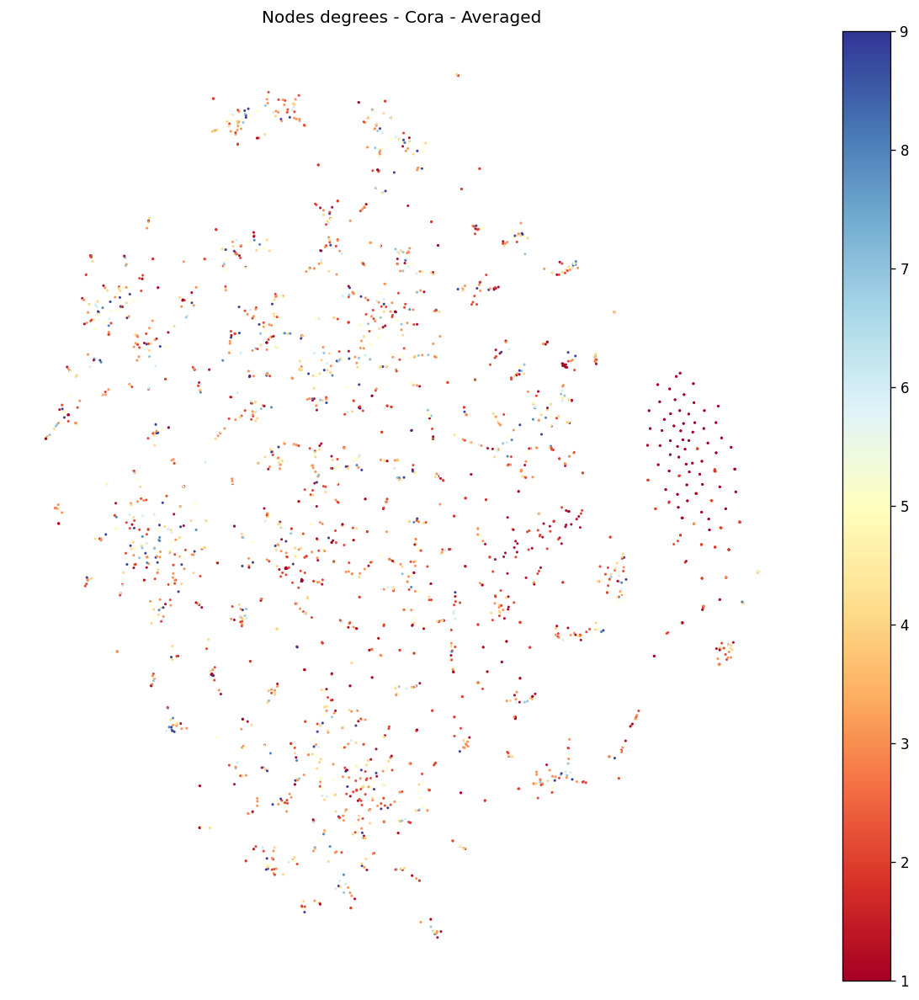

The undirected graph MashupPPI has 16143 nodes and 300181 weighted edges, of which 29 are self-loops. The graph is sparse as it has a density of 0.00230 and has 18 connected components, where the component with most nodes has 16100 nodes and the component with the least nodes has 2 nodes. The graph median node degree is 13, the mean node degree is 37.19, and the node degree mode is 1. The top 5 most central nodes are 147 (degree 7052), 196 (degree 1717), 397 (degree 1273), 1915 (degree 1036) and 995 (degree 957). The hash of the graph is c74577c27de2a918 .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

Plotting node types:   0%|          | 0/28 [00:00<?, ?it/s]

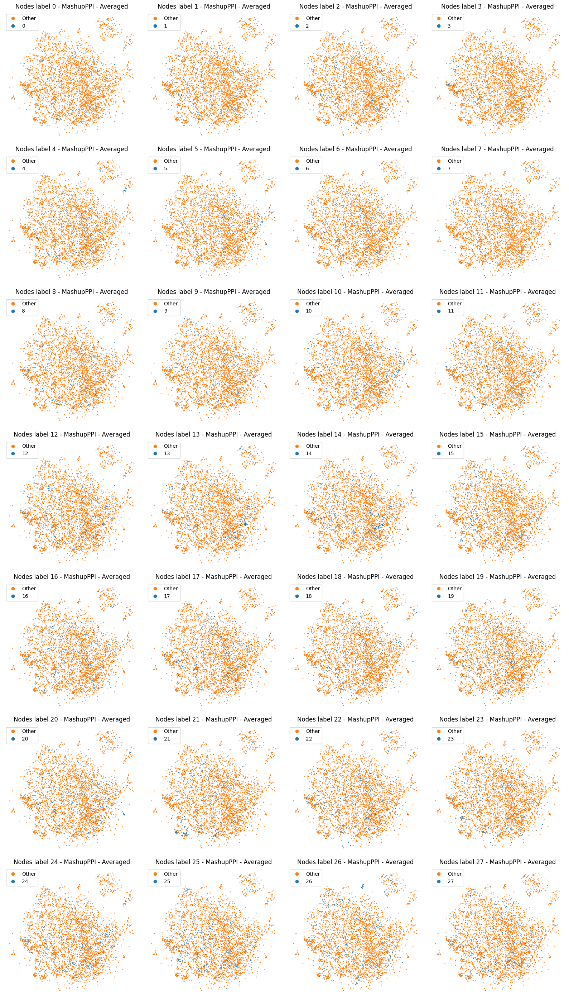

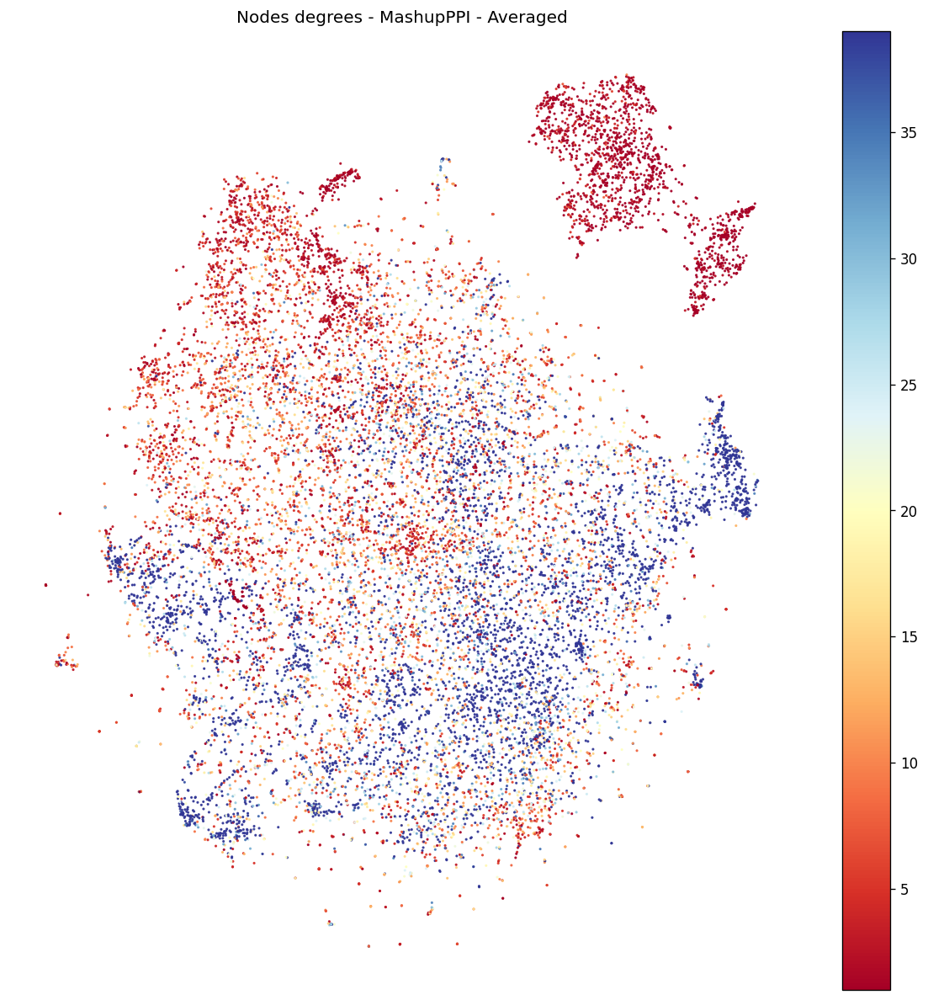

The undirected graph node2vecPPI has 3890 nodes, of which 30 are singletons (all have self-loops), and 38739 unweighted edges, of which 894 are self-loops. The graph is sparse as it has a density of 0.00506 and has 35 connected components, where the component with most nodes has 3852 nodes and the component with the least nodes has a single node. The graph median node degree is 9, the mean node degree is 19.69, and the node degree mode is 1. The top 5 most central nodes are 3631 (degree 594), 825 (degree 419), 1220 (degree 394), 1043 (degree 383) and 1557 (degree 377). The hash of the graph is 3a2b59e2bdf0d25b .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

Plotting node types:   0%|          | 0/50 [00:00<?, ?it/s]

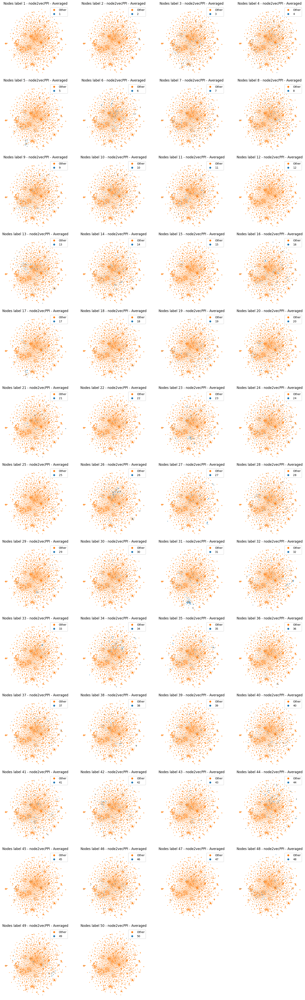

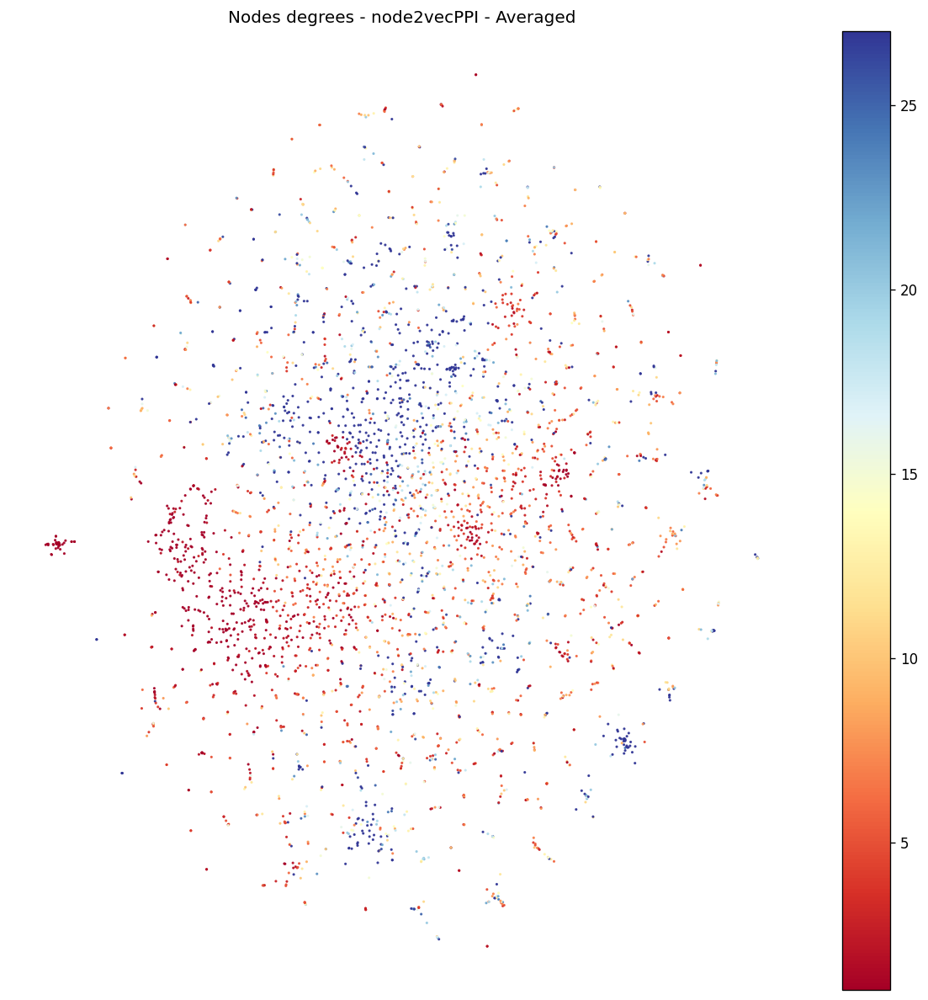

The undirected graph CTDDDA has 12765 nodes with 2 different node types: chemical (nodes number 9580) and disease (nodes number 3185) and 92813 unweighted edges, of which none are self-loops. The graph is sparse as it has a density of 0.00114 and has 20 connected components, where the component with most nodes has 12724 nodes and the component with the least nodes has 2 nodes. The graph median node degree is 3, the mean node degree is 14.54, and the node degree mode is 1. The top 5 most central nodes are D056486 (degree 1217), D012640 (degree 1098), D006973 (degree 838), D009336 (degree 831) and D007674 (degree 705). The hash of the graph is d0ea7570f7a904ae .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

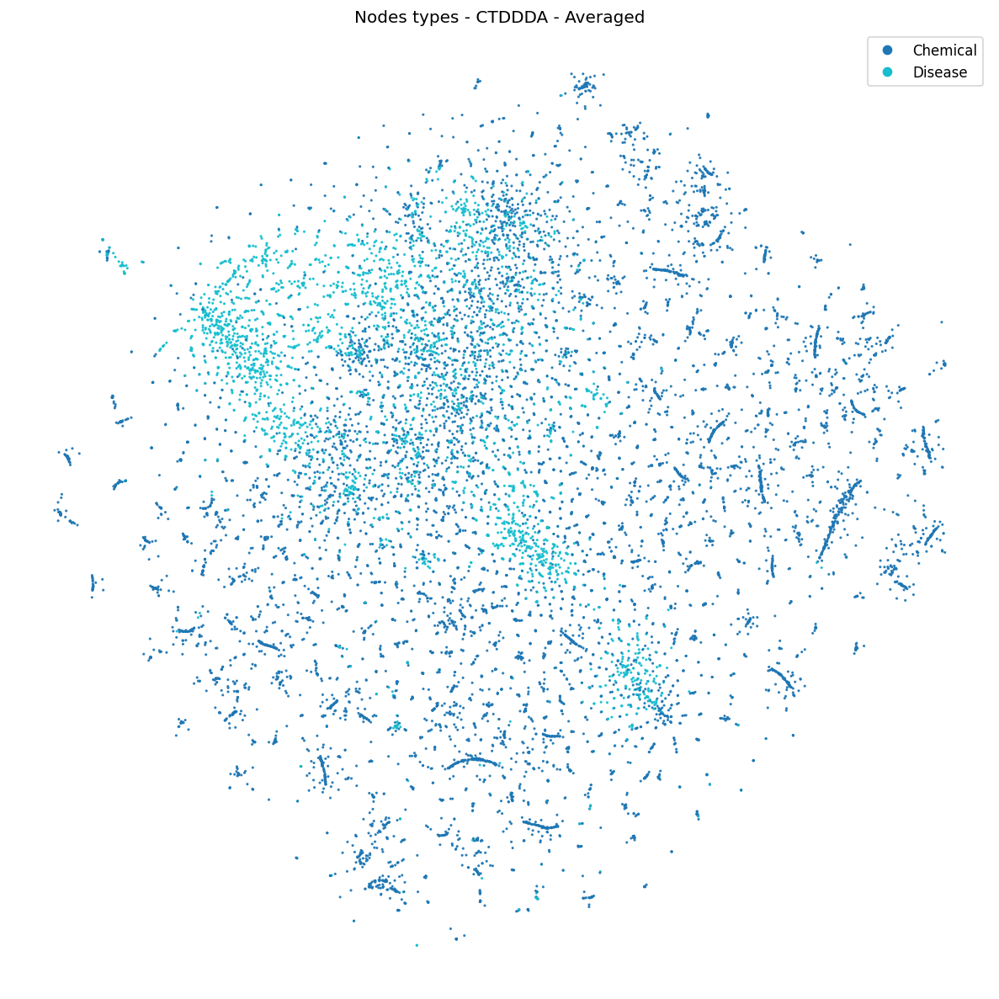

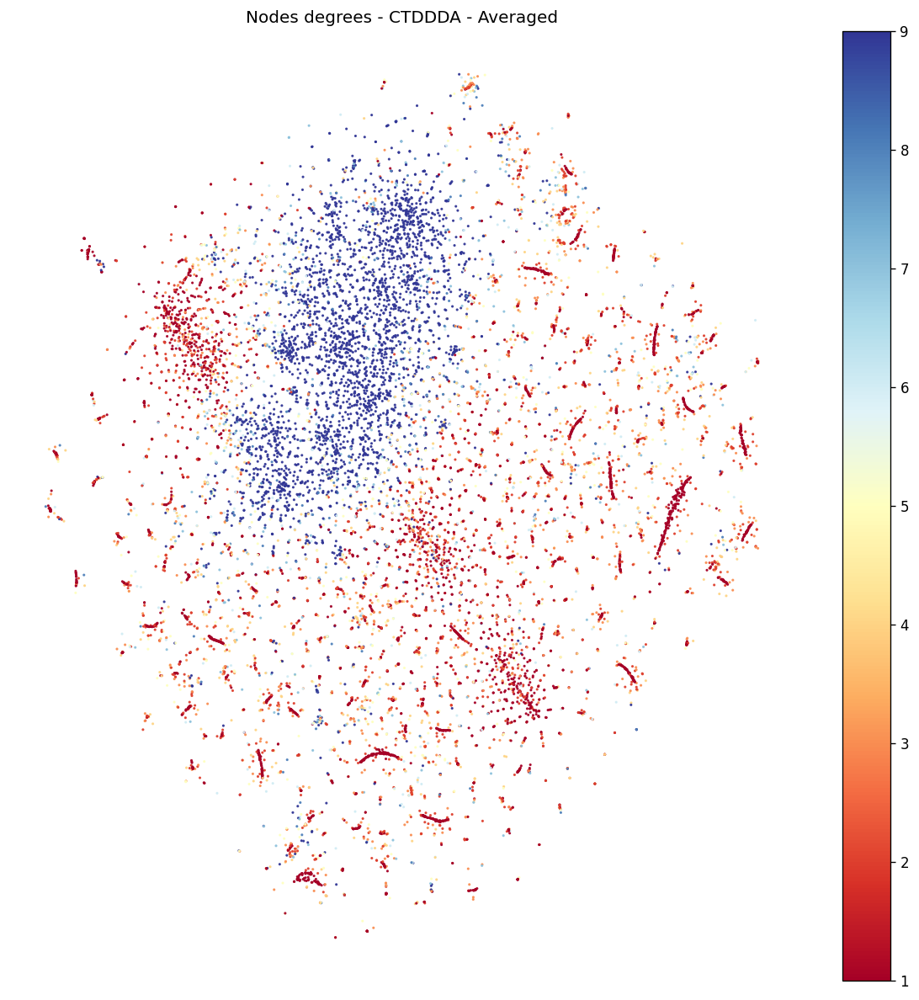

The undirected graph NDFRTDDA has 13545 nodes with 2 different node types: drug (nodes number 12337) and disease (nodes number 1208) and 56515 unweighted edges, of which none are self-loops. The graph is quite sparse as it has a density of 0.00062 and has 85 connected components, where the component with most nodes has 13033 nodes and the component with the least nodes has 2 nodes. The graph median node degree is 3, the mean node degree is 8.34, and the node degree mode is 1. The top 5 most central nodes are C0030193 (degree 845), C0004623 (degree 741), C0004096 (degree 653), C0038160 (degree 575) and C0020538 (degree 534). The hash of the graph is aff446d784c13f38 .

Methods:   0%|          | 0/3 [00:00<?, ?it/s]

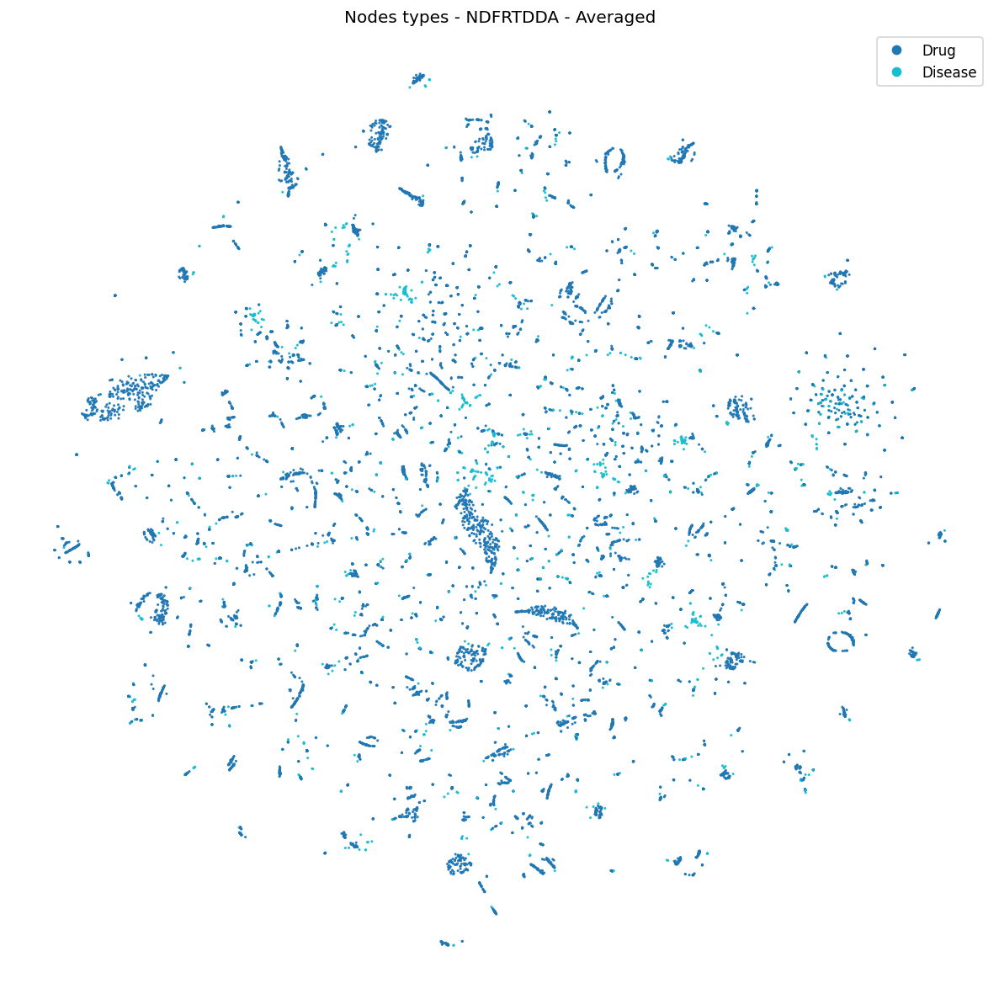

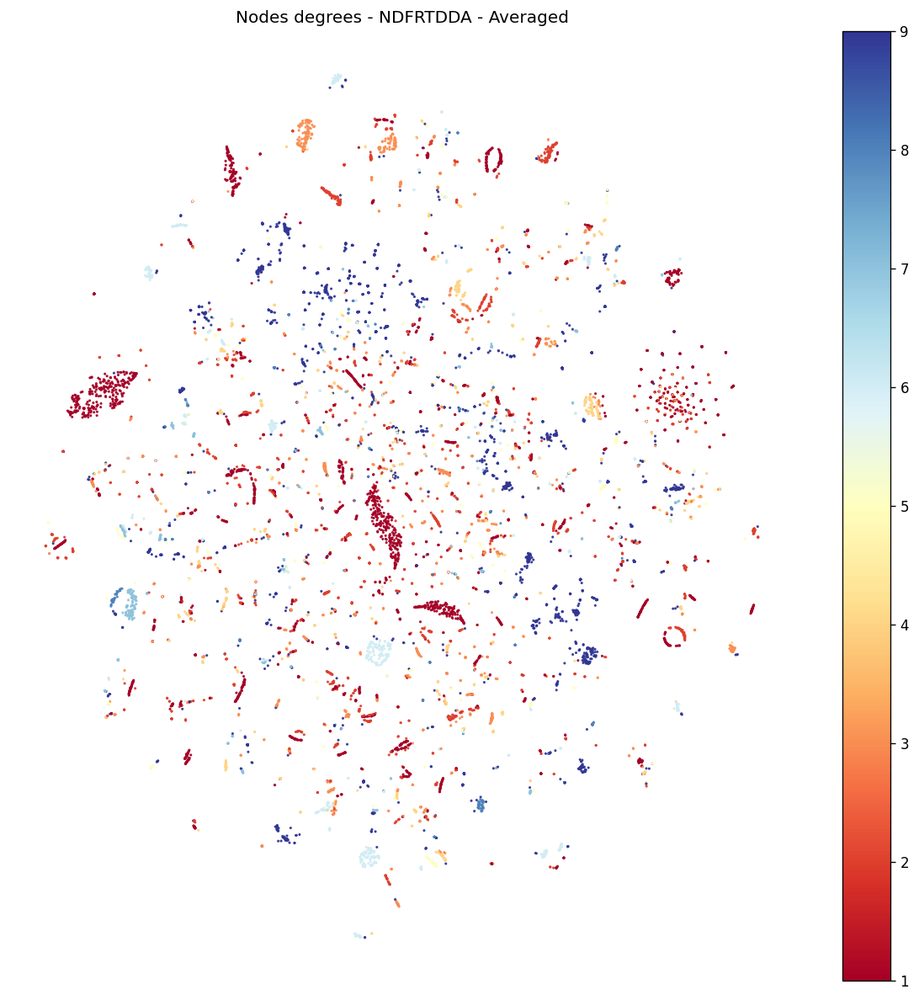

In [10]:


for graph_loader, node_labels_loader in tqdm((
    (CiteSeer, None),
    (PubMedDiabetes, None),
    (Cora, None),
    (MashupPPI, load_mashup_multi_labels),
    #(ClinTermCOOC, load_clinterm_multi_labels),
    (node2vecPPI, load_node2vec_multi_labels),
    (CTDDDA, None),
    (NDFRTDDA, None)
), desc="Graphs"):
    graph = graph_loader().remove(deny_node_types_set=set(["Word"]))
    graph.enable(
        vector_destinations=True,
        vector_outbounds=True
    )
    labels = None if node_labels_loader is None else node_labels_loader()
    
    for method in tqdm(get_available_node_embedding_methods(), leave=False, desc="Methods"):
        node_embedding = compute_node_embedding(
            graph,
            node_embedding_method_name=method,
            devices=["/GPU:0", "/GPU:1", "/GPU:2", "/GPU:3"]
        )
        # The following line is needed for a limit that is currently present in cache decorator.
        node_embedding.index = node_embedding.index.astype(str)
        
        train_x, test_x, train_y, test_y
        
        forest = RandomForestClassifier(n_estimators=500, max_depth=20)
        forest.fit()
        
        continue
        # Then we visualize the obtained node embedding using 2D TSNE decomposition
        visualizer = GraphVisualization(
            graph,
            node_embedding_method=method
        )
        visualizer.fit_transform_nodes(node_embedding)
        if labels is not None:
            plot_multi_labels_nodes(visualizer, labels)
        else:
            visualizer.plot_node_types()
        visualizer.plot_node_degrees()
        plt.show()